In [1]:
import numpy as np
import os
from Utils.plotParam import getDynamicalStates
from Utils.Common import getRealData,angle_between


In [2]:
from time import time

pwd_base = "/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/"
filename = "trajectories_wo_gaps.npy"
fish=[10,60,80,100]
subdirs = [1,2,3]
join = os.path.join

result = []
def calcTurninRate(data):
    all_angles = []
    for i in range(2,len(data)):
        pos_prev_last = data[i-2]
        pos_last = data[i-1]
        pos_atm  = data[i]
        
        direction_a = pos_atm-pos_last
        direction_b = pos_last-pos_prev_last
        angles = [np.rad2deg(angle_between(d1,d2)) for d1,d2 in zip(direction_b,direction_a)]
        all_angles.append(angles)
    return all_angles
for i in fish:
    for s in subdirs:
        path = join(join(join(pwd_base,str(i)),str(s)),filename)
        print(path)
        data = getRealData(path)
        start = time()
        path2turningrate = path.replace(path.split("/")[-1],"turningrate")
        try:
            turningrate = np.load(path2turningrate+".npz",allow_pickle=True)
            print("found")
        except:
            print("notFound")
            tr = np.array(calcTurninRate(data))
            
            np.savez(path2turningrate,turningrate=tr)
            

        print(time()-start)


/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/10/1/trajectories_wo_gaps.npy
found
0.0011615753173828125
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/10/2/trajectories_wo_gaps.npy
found
9.298324584960938e-05
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/10/3/trajectories_wo_gaps.npy
found
9.393692016601562e-05
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/60/1/trajectories_wo_gaps.npy
found
0.00019073486328125
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/60/2/trajectories_wo_gaps.npy
found
0.0002357959747314453
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/60/3/trajectories_wo_gaps.npy
found
0.0002033710479736328
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/80/1/trajectories_wo_gaps.npy
found
0.00019669532775878906
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/80/2/trajectories_wo_gaps.npy
found
0.0002036094665

In [3]:
from time import time
def calcSpeed(data):
    speed = []
    for i in range(1,len(data)):
        v = np.sqrt(np.sum((data[i]-data[i-1])**2,axis=-1))
        speed.append(v)

    return np.array(speed)

def calcDistances(data):
    distances = []
    for i in range(len(data)):
        pos_atm = data[i]
        a = pos_atm.repeat(len(pos_atm),0).reshape(len(pos_atm),len(pos_atm),2)

        dist = np.sqrt(np.sum((a.transpose(1,0,2)-a)**2,axis=-1)).flatten()
        dist = dist[dist !=0]
        distances.append(dist)
    return np.array(dist,dtype=object)
    

for i in fish:
    for s in subdirs:
        path = join(join(join(pwd_base,str(i)),str(s)),filename)
        data = getRealData(path)


        path2dist = path.replace(path.split("/")[-1],"distances")
        try:
            speed = np.load(path2dist+".npz",allow_pickle=True)
            print("found")
        except:
            print("notFound")
            start = time()
            tr = calcDistances(data)
            print(time()-start)
            np.savez(path2dist,distance=tr)


found
found
found
found
found
found
found
found
found
found
found
found


In [4]:
def getTurningrate(path2file):
    path2turningrate = path2file.replace(path2file.split("/")[-1],"turningrate")
        
    try:
        tr = np.load(path2turningrate+".npz",allow_pickle=True)["turningrate"]
        print("found")
    except:
        print("notFound")
        data = getRealData(path2file)
        tr = np.array(calcTurninRate(data))
        np.savez(path2turningrate,turningrate=tr)
    return tr


/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/10/1/trajectories_wo_gaps.npy
Found it


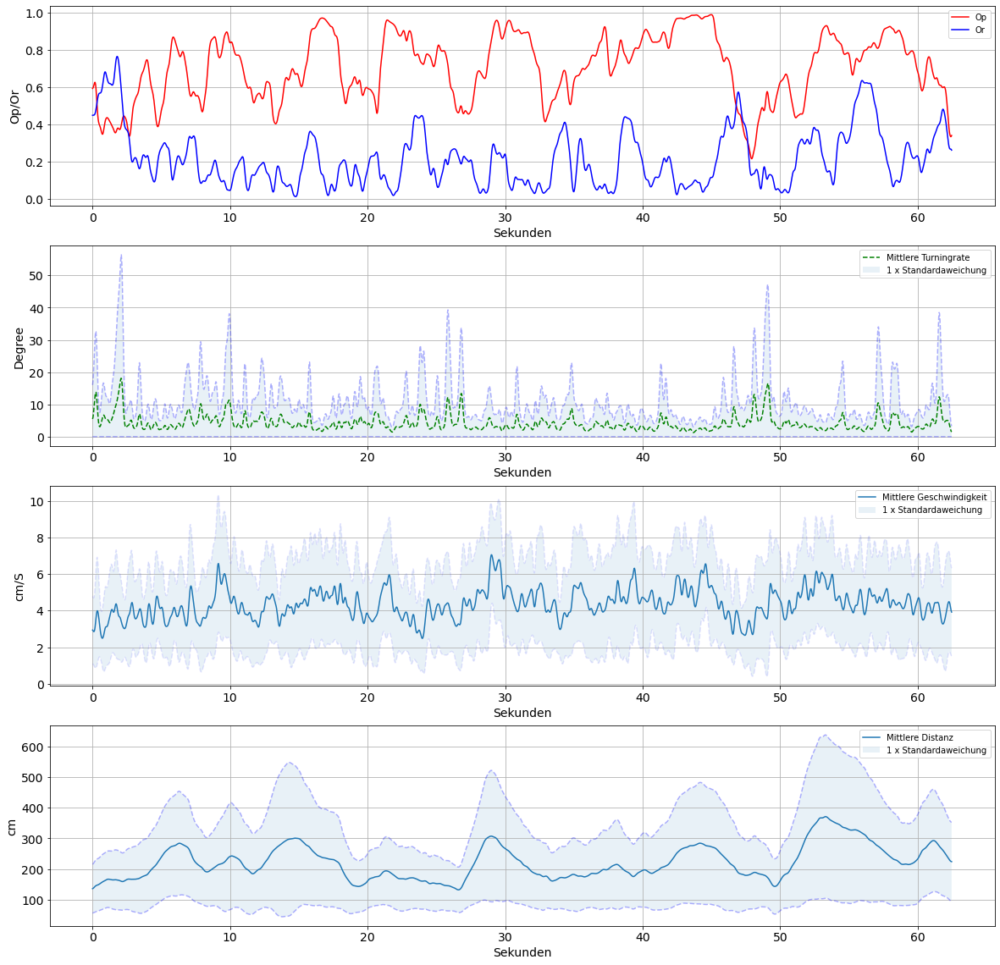

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/10/2/trajectories_wo_gaps.npy
Found it


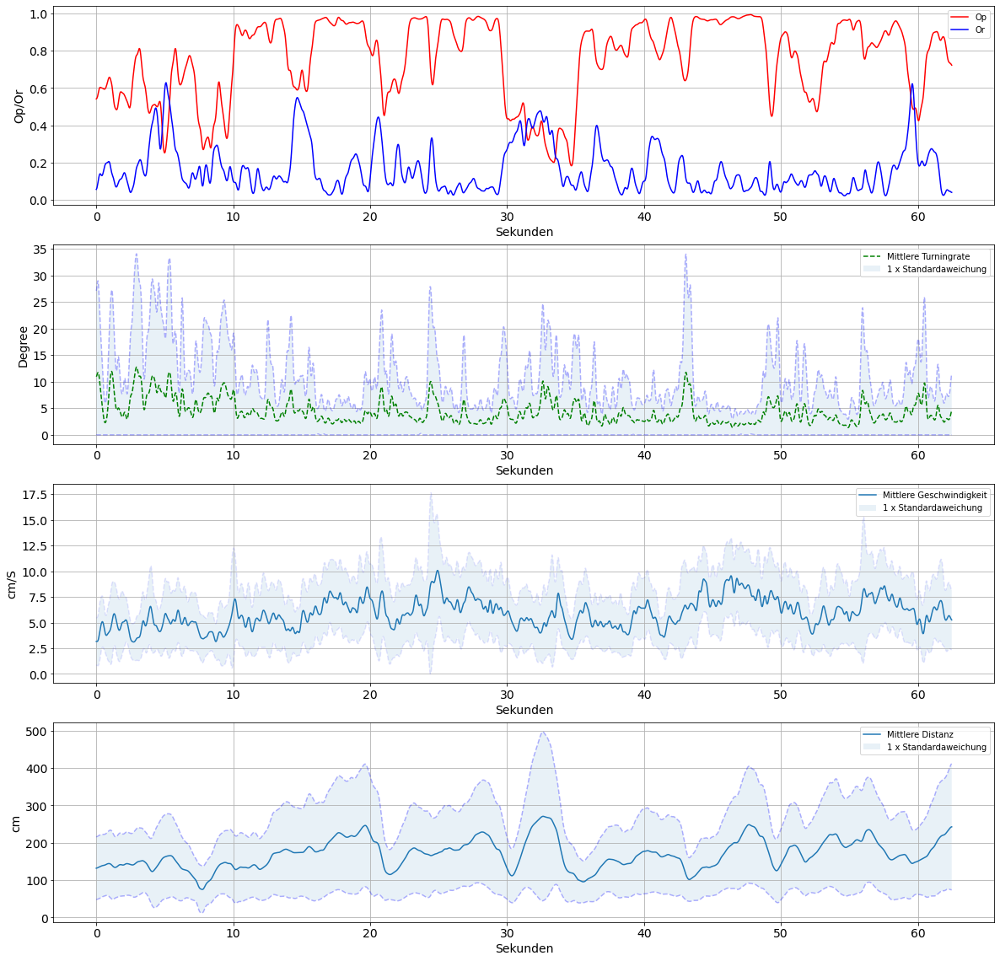

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/10/3/trajectories_wo_gaps.npy
Found it


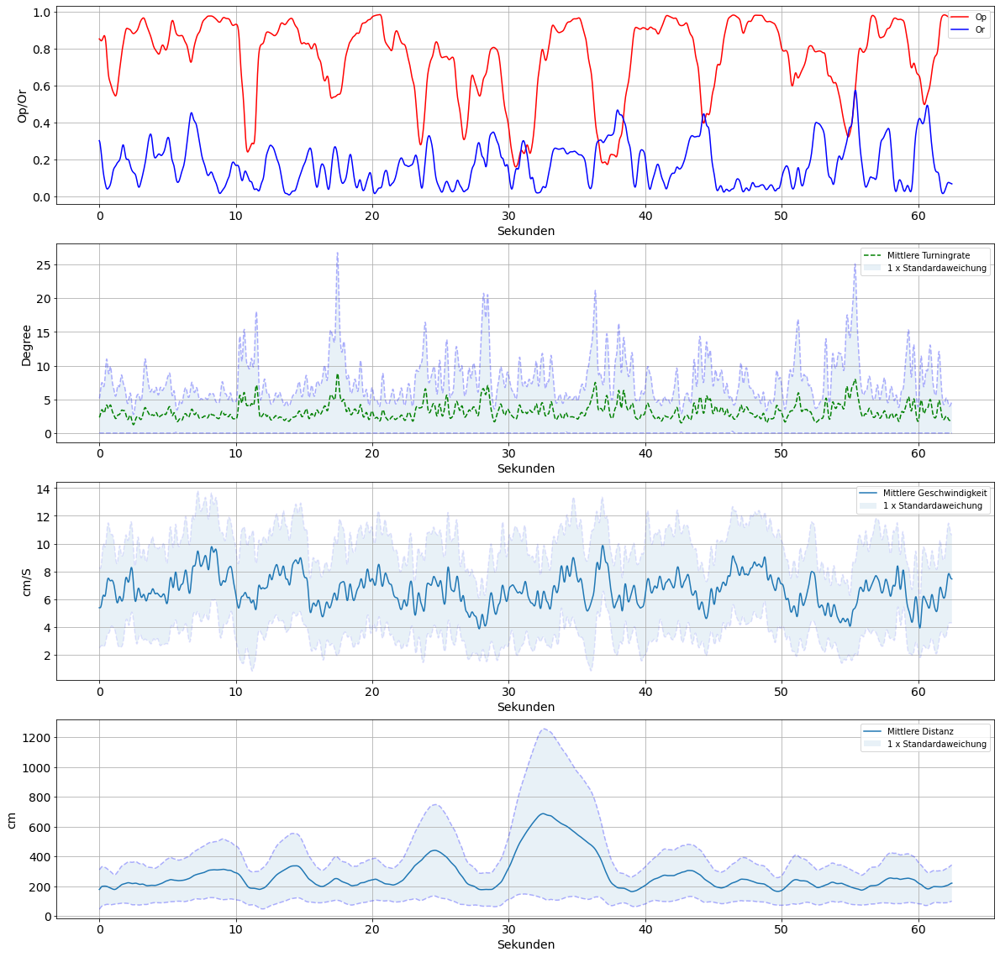

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/60/1/trajectories_wo_gaps.npy
Found it


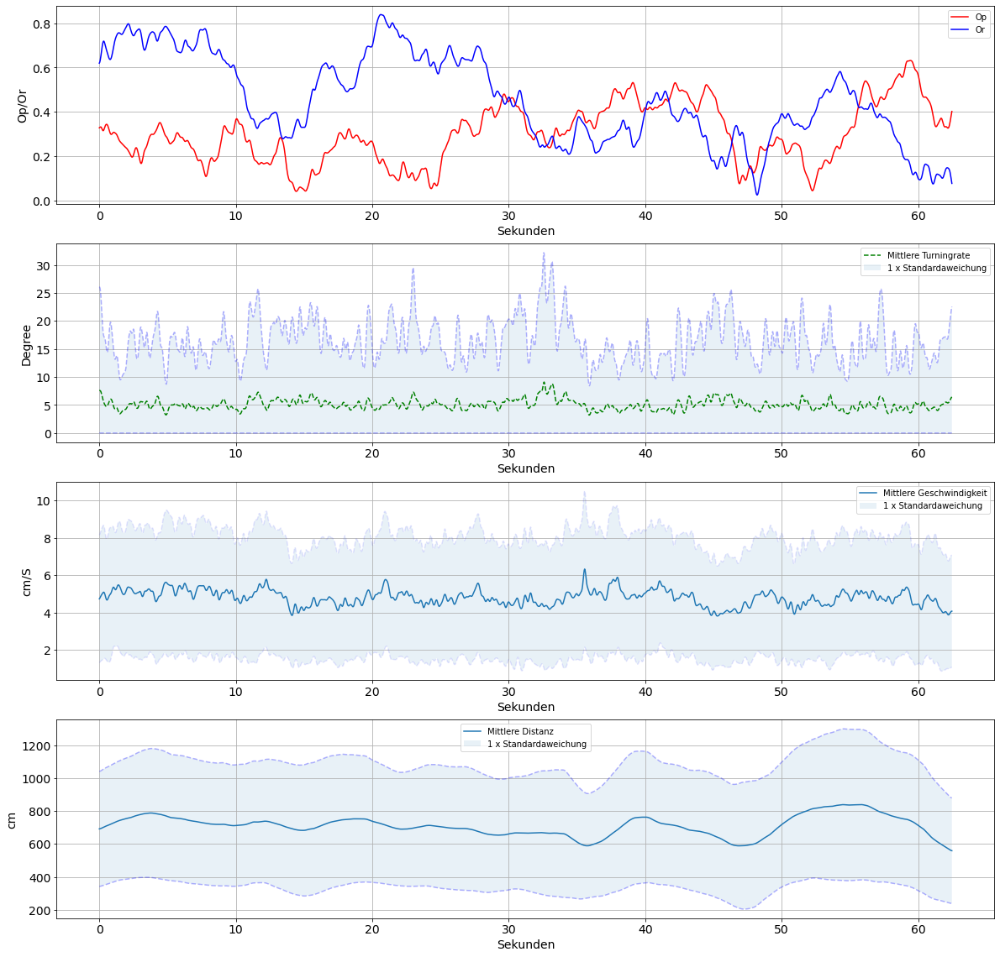

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/60/2/trajectories_wo_gaps.npy
Found it


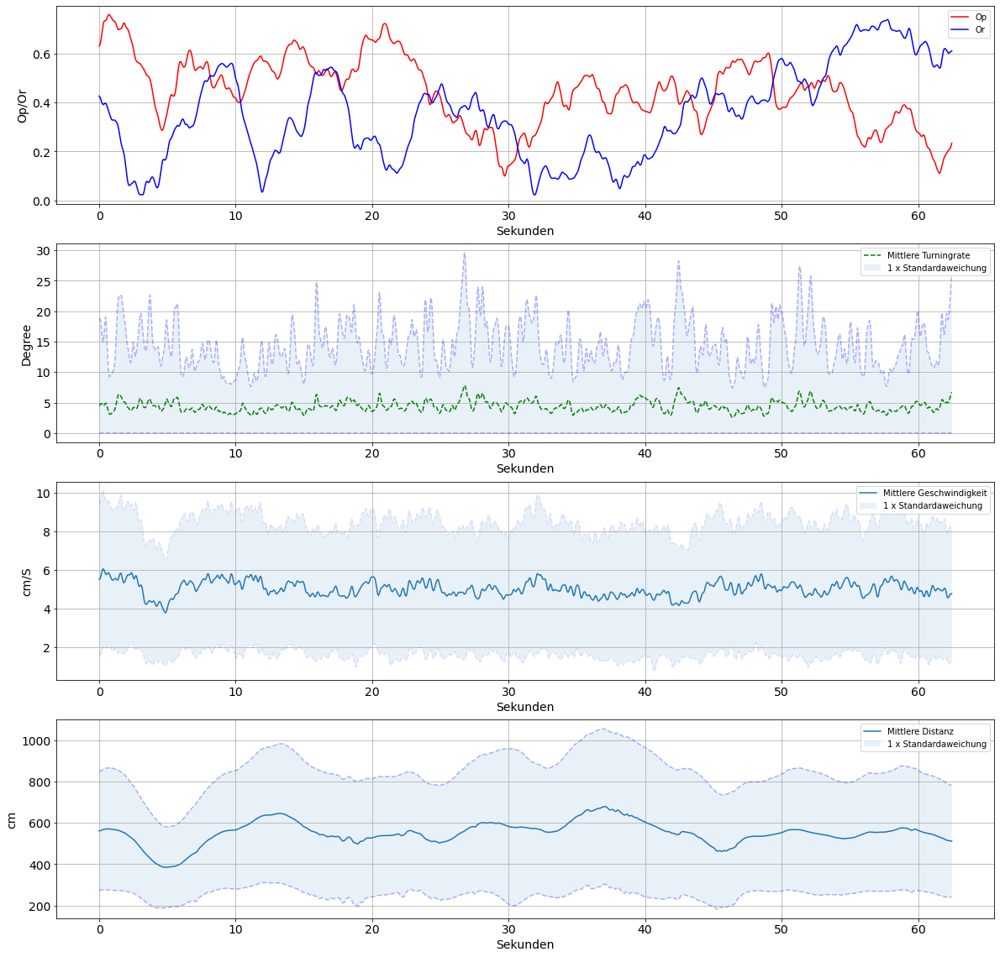

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/60/3/trajectories_wo_gaps.npy
Found it


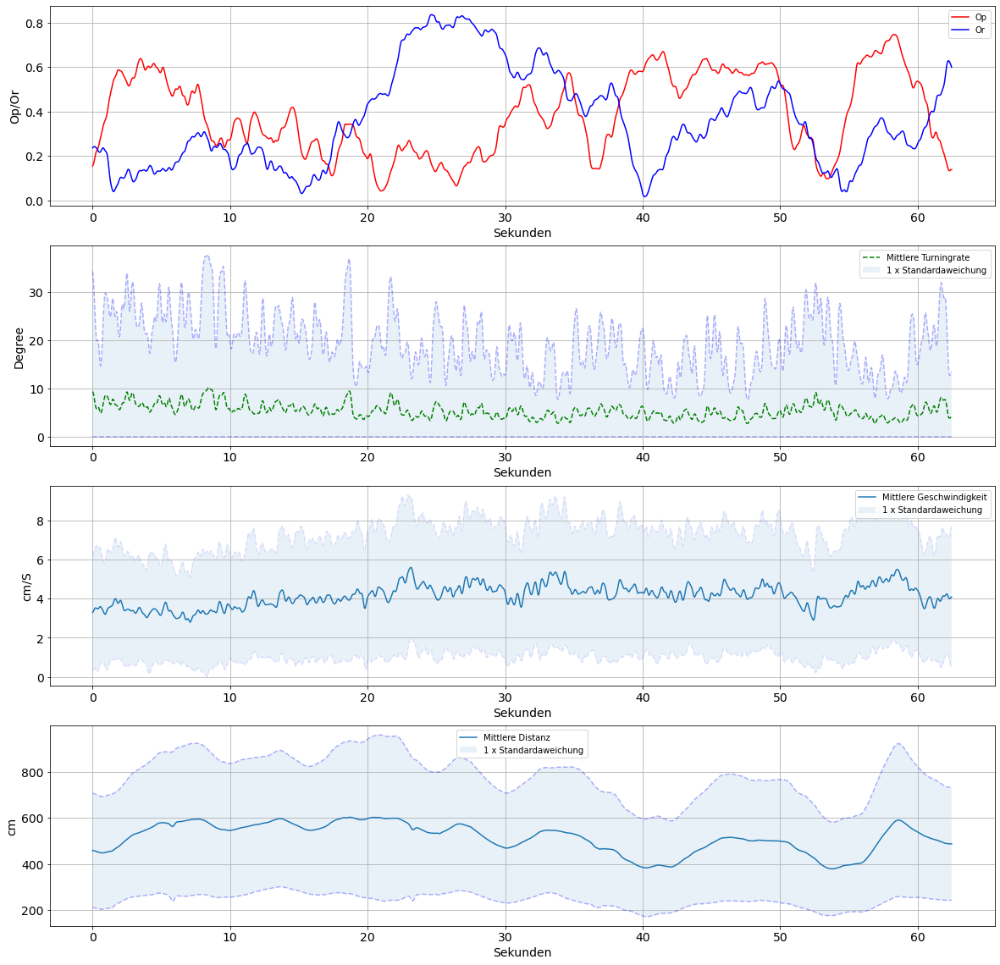

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/80/1/trajectories_wo_gaps.npy
Found it


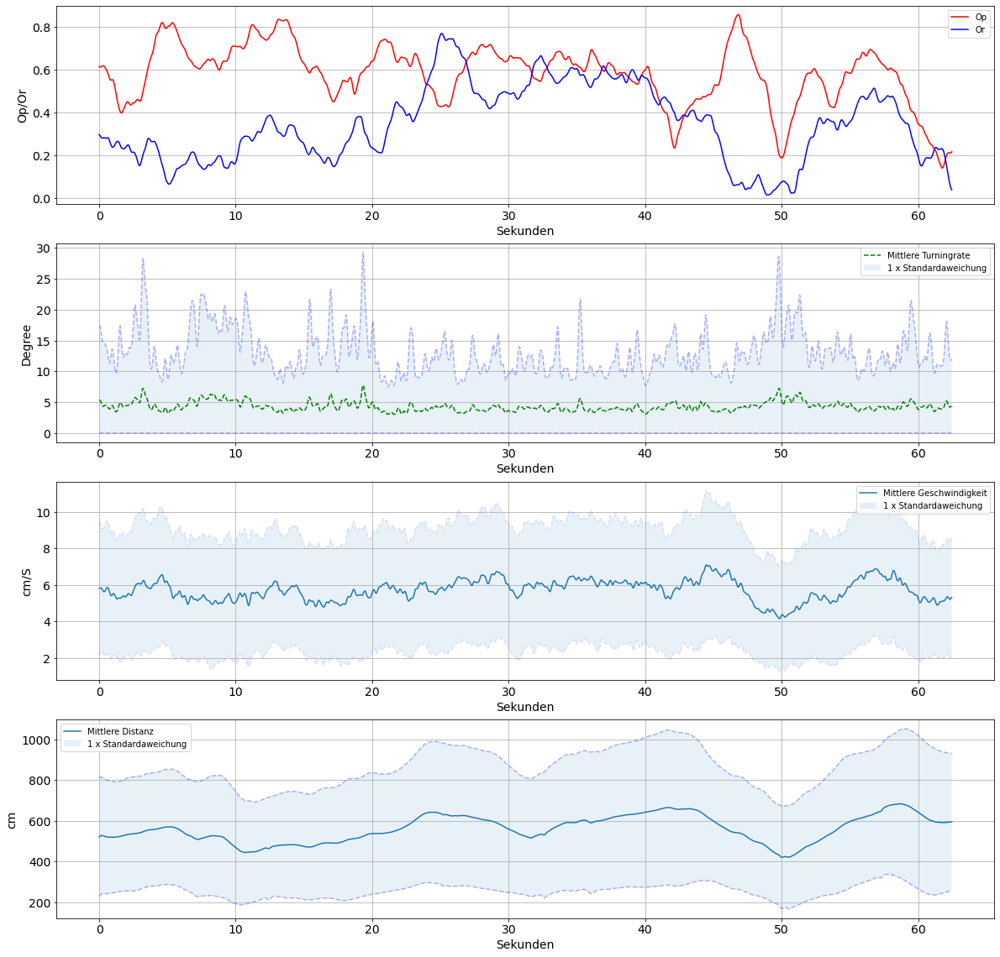

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/80/2/trajectories_wo_gaps.npy
Found it


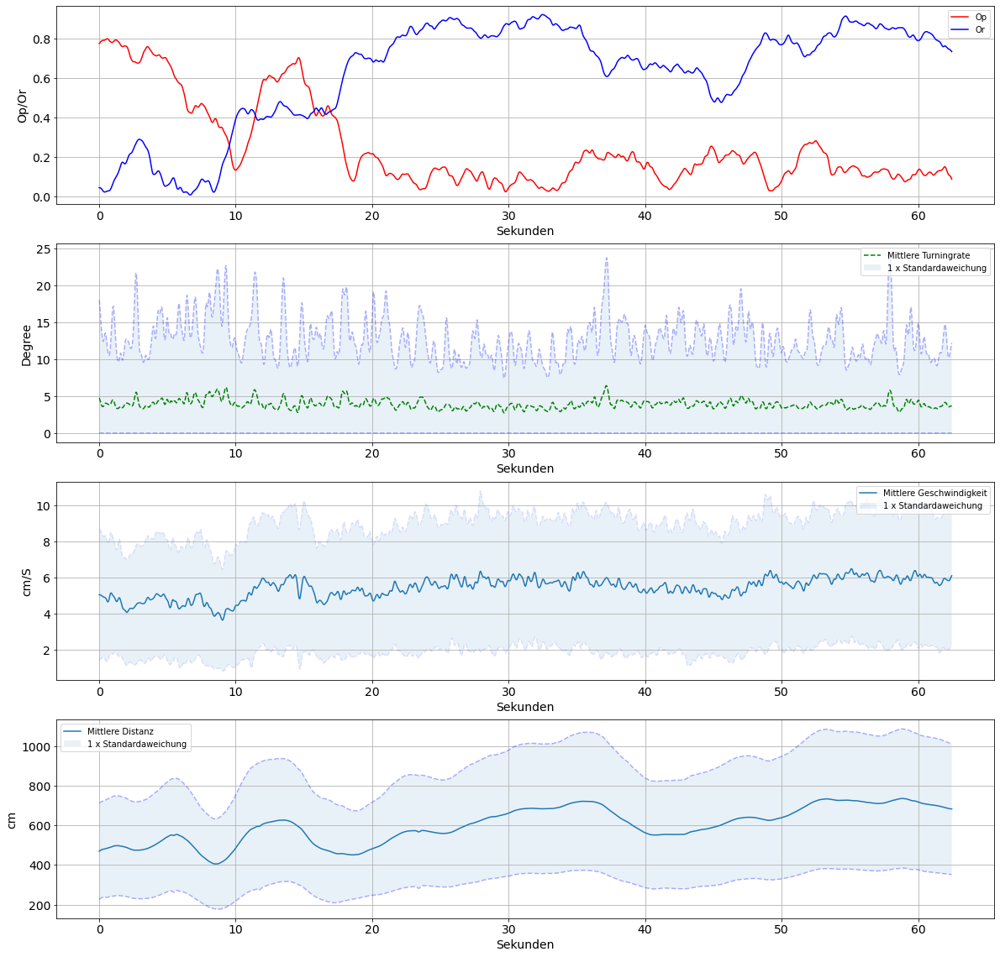

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/80/3/trajectories_wo_gaps.npy
Found it


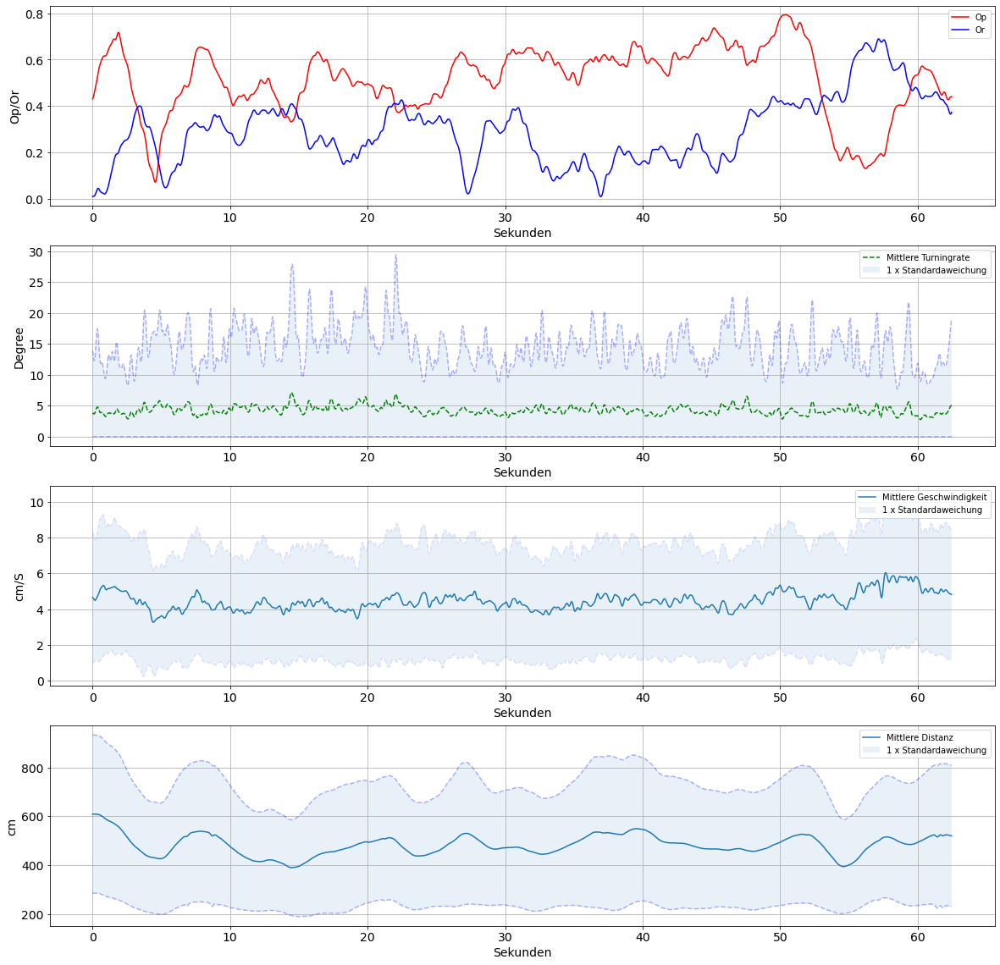

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/100/1/trajectories_wo_gaps.npy
Found it


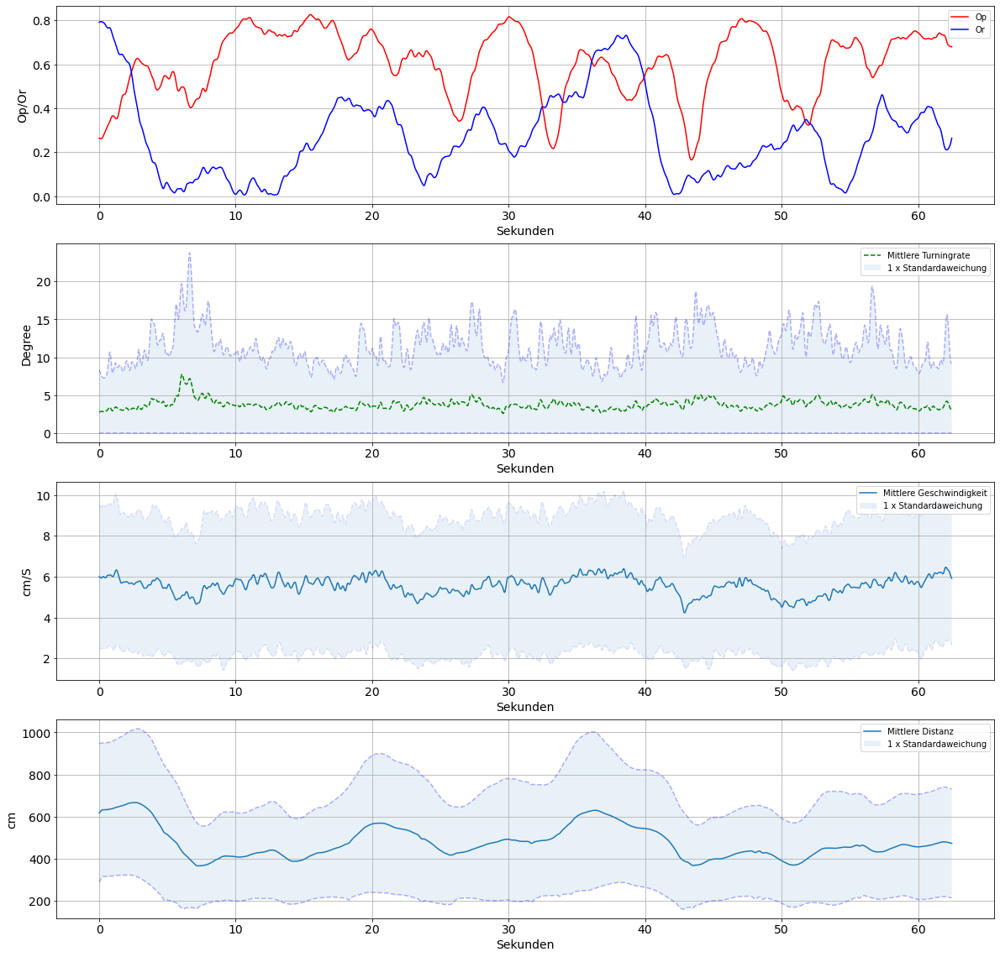

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/100/2/trajectories_wo_gaps.npy
Found it


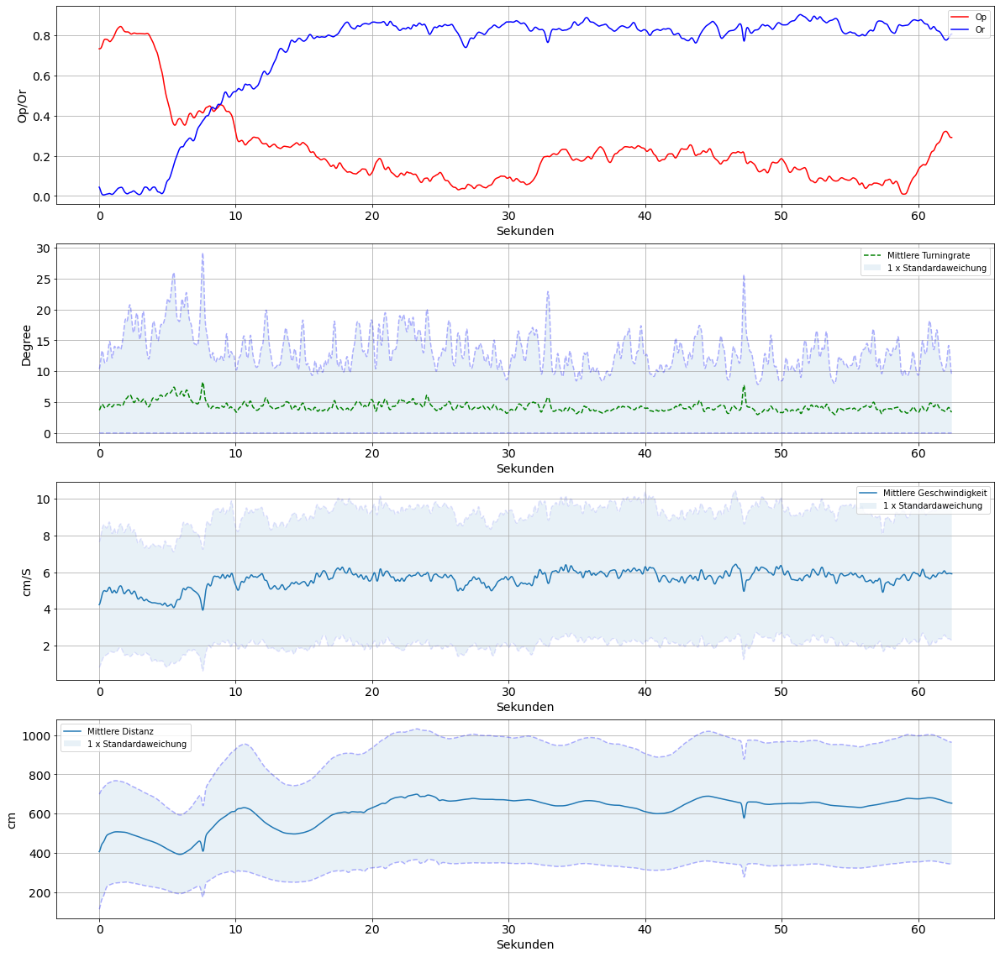

/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/100/3/trajectories_wo_gaps.npy
Found it


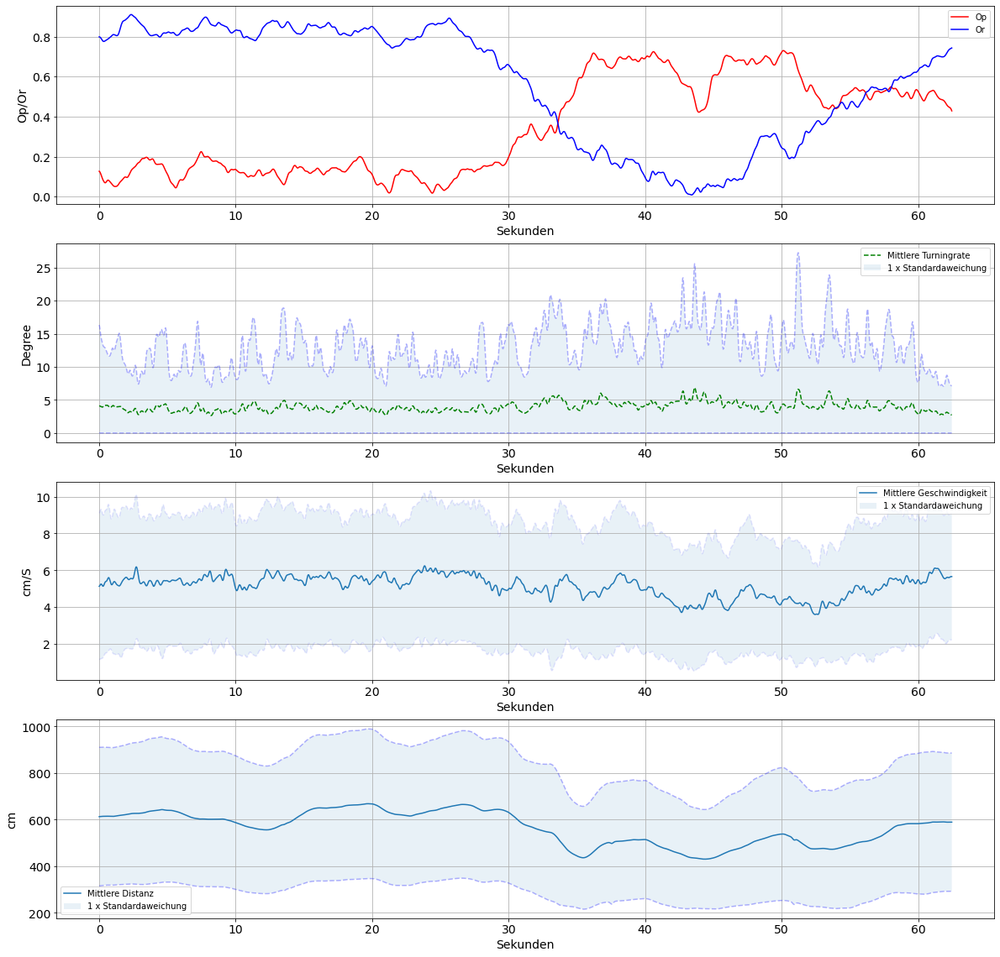

In [5]:
import matplotlib.pyplot as plt
import os
from scipy.ndimage import gaussian_filter1d
from Utils.Common import getSpeed,getTurningrate,getDistances
from Utils.plotParam import getDynamicalStates
import numpy as np

def plot_turningrate(path2file,start_idx=0,end_idx=-1):
    Op,Or = getDynamicalStates(path2file)
    Op,Or = np.array(Op[:-1]),np.array(Or[:-1])
    turninRate = getTurningrate(path2file)
    turninRate = np.nan_to_num(turninRate)
    speed      = np.nan_to_num(getSpeed(path2file))
    
    distances  = getDistances(path2file).astype(np.float)
    # 70cm/4341 (pixel durchmesser)
    pixelToCM = 0.016*32
    sigma = 3
    
    Quantil_label = "1 x Standardaweichung"
    STD_Faktor    = 1
    
    mean_speed = speed.mean(axis=-1)
    mean_speed = gaussian_filter1d(mean_speed[start_idx:end_idx]*pixelToCM,sigma)
    std_speed = speed.std(axis=-1)
    std_speed = STD_Faktor*gaussian_filter1d(std_speed[start_idx:end_idx]*pixelToCM,sigma)

    distances = distances.reshape((len(distances),distances.shape[1]*distances.shape[-1]))
    distances_a = distances.copy()
    distances_max = distances_a.max(axis=-1)
    distances_max = gaussian_filter1d(distances_max[start_idx:end_idx]*pixelToCM,sigma)
    
    distances_a[distances==0]=np.inf
    distances_min = distances_a.min(axis=-1)
    distances_min = gaussian_filter1d(distances_min[start_idx:end_idx]*pixelToCM,sigma)
    
    mean_distances = np.mean(distances,axis=-1)
    mean_distances = gaussian_filter1d(mean_distances[start_idx:end_idx]*pixelToCM,sigma)
    
    std_distances  = np.std(distances,axis=-1)
    std_distances = STD_Faktor*gaussian_filter1d(std_distances[start_idx:end_idx]*pixelToCM,sigma)


    fig, axs = plt.subplots(4, 1,figsize=(20,20))
    faktor = 1/32


    x = np.arange(len(turninRate))
    x = x[start_idx:end_idx]*faktor
    turningRate_mean = turninRate.mean(axis=1)[start_idx:end_idx]
    turningRate_std = turninRate.std(axis=1)[start_idx:end_idx]

    turningRate_mean = gaussian_filter1d(turningRate_mean,sigma)
    turningRate_std = STD_Faktor*gaussian_filter1d(turningRate_std,sigma)
    

    
    axs[0].plot(x,gaussian_filter1d(Op,sigma)[start_idx:end_idx],label="Op",color="red")
    #axs[0].set_xticks((1/30))

    axs[0].plot(x,gaussian_filter1d(Or,sigma)[start_idx:end_idx],label="Or",color="blue")
    
    axs[1].plot(x,turningRate_mean,'--',color="green",label="Mittlere Turningrate")
    axs[1].plot(x,turningRate_mean+turningRate_std,'--',color = "blue",alpha = 0.3)
    axs[1].plot(x,np.clip(turningRate_mean-turningRate_std,0,(turningRate_mean+turningRate_std).max()),'--',color = "blue",alpha = 0.3)
    axs[1].fill_between(x,turningRate_mean+turningRate_std,np.clip(turningRate_mean-turningRate_std,0,(turningRate_mean+turningRate_std).max()),alpha=0.1,label=Quantil_label)
    
    axs[1].set_ylabel("Degree",fontsize=14)
    axs[0].set_ylabel("Op/Or",fontsize=14)
    axs[1].set_xlabel("Sekunden",fontsize=14)
    axs[0].set_xlabel("Sekunden",fontsize=14)



    axs[2].plot(x,mean_speed,label="Mittlere Geschwindigkeit")
    axs[2].plot(x,mean_speed+std_speed,"--",color="blue",alpha=0.1)
    axs[2].plot(x,np.clip(mean_speed-std_speed,0,(mean_speed+std_speed).max()),"--",color="blue",alpha=0.1)
    axs[2].fill_between(x,mean_speed+std_speed,np.clip(mean_speed-std_speed,0,(mean_speed+std_speed).max()),alpha=0.1,label=Quantil_label)

    axs[2].set_ylabel("cm/S",fontsize=14)
    axs[2].set_xlabel("Sekunden",fontsize=14)

    
    axs[3].plot(x,mean_distances,label="Mittlere Distanz")
    axs[3].plot(x,mean_distances+std_distances,'--',color = "blue",alpha = 0.3)
    axs[3].plot(x,np.clip(mean_distances-std_distances,0,(mean_distances+std_distances).max()),'--',color = "blue",alpha = 0.3)
    axs[3].fill_between(x,mean_distances+std_distances,np.clip(mean_distances-std_distances,0,(mean_distances+std_distances).max()),alpha=0.1,label=Quantil_label)
    axs[3].set_ylabel("cm",fontsize=14)
    axs[3].set_xlabel("Sekunden",fontsize=14)

    for i in range(len(axs)):
        axs[i].legend(loc="upper right")
        axs[i].grid(True)
        axs[i].tick_params(axis='both', which='major', labelsize=14)
        axs[i].tick_params(axis='both', which='minor', labelsize=14)
    plt.legend()

    plt.show()


pwd_base = "/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/"
filename = "trajectories_wo_gaps.npy"
fish=[10,60,80,100]
subdirs = [1,2,3]
join = os.path.join
result = []

for i in fish:
    for s in subdirs:
        path = join(join(join(pwd_base,str(i)),str(s)),filename)
        print(path)
        plot_turningrate(path,start_idx=0,end_idx=2000)


<generator object SigmoidError.__call__ at 0x7f75d88984a0>


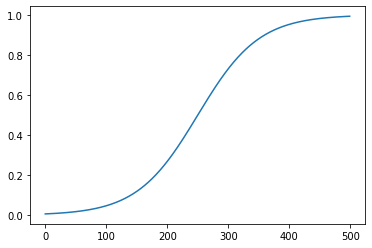

In [6]:


class SigmoidError(object):
    """docstring for SigmoidError"""
    def __init__(self, frames):
        super(SigmoidError, self).__init__()
        self.x = np.arange(frames)
        self.__name__=self.__name__()
    def __name__(self):
        return "SigmoidError"
    def sigmoid(self,x):
        return 1 / (1 + np.exp((-x+(frames//2))/50))
    def __call__(self):
        i = 0
        while i<len(self.x):
            yield self.sigmoid(self.x[i])
            i+=1


frames = 500
a = SigmoidError(frames)
x = np.arange(frames)
t = a()
print(t)
y = [i for i in a()]
plt.plot(x,y)    

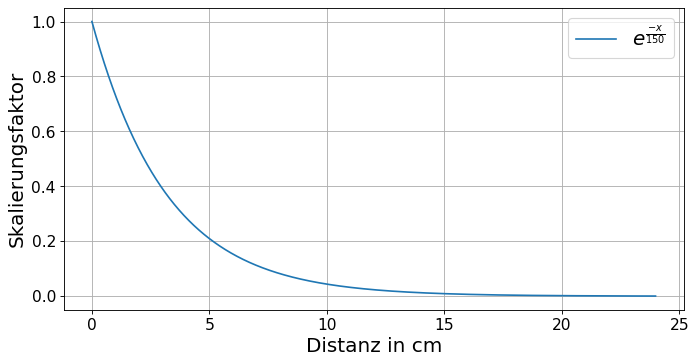

In [7]:
dist = np.arange(1500)
beta = 1/200
pixelToCM = 0.016
plt.figure(figsize=(10,5),dpi=80)
dist = dist* pixelToCM 
beta /= pixelToCM

facV1 = np.exp(-dist*beta)

plt.plot(dist,facV1,label=r'$e^{\frac{-x}{150}}$')
plt.ylabel("Skalierungsfaktor",fontsize=18)
plt.xlabel("Distanz in cm",fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(prop={'size': 18})
plt.grid(True)

0.3125


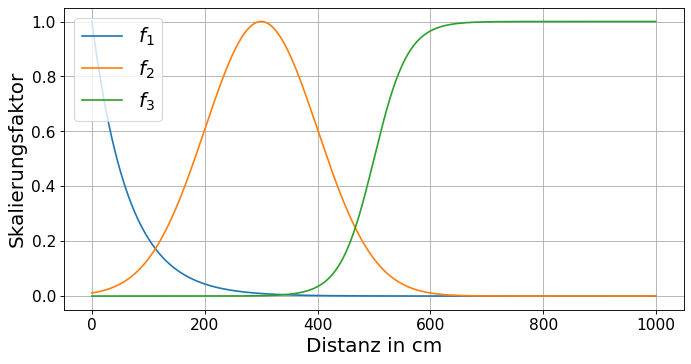

In [8]:
dist = np.arange(1000)
rad = 4000/50
facV2 = 2/(1+np.exp(-(dist/(rad))))-0.5

def gaussian(x, mu, sig):
    return np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

plt.figure(figsize=(10,5),dpi=80) 
facV2 = gaussian(dist,300,100)
x = dist
facV3 = 1 / (1 + np.exp((-x+500)/30))

facV1 = np.exp((-dist/20)*beta)
plt.plot(dist,facV1,label=r'$f_1$')
plt.plot(dist,facV2,label=r'$f_2$')
plt.plot(dist,facV3,label=r'$f_3$')
plt.ylabel("Skalierungsfaktor",fontsize=18)
plt.xlabel("Distanz in cm",fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(prop={'size': 18},loc="upper left")
plt.grid(True)

0.005333333333333333
0.3333333333333333


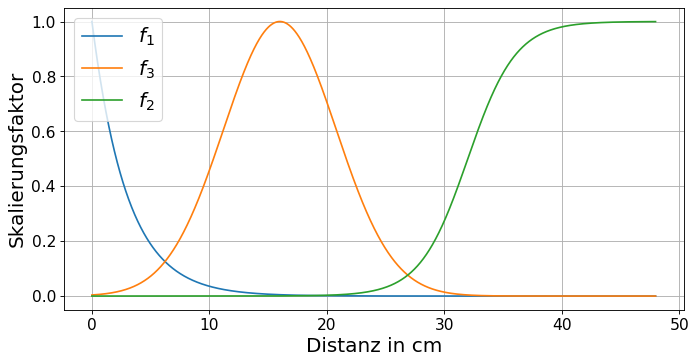

In [9]:
dist = np.arange(3000)
rad = 4000/50
facV2 = 2/(1+np.exp(-(dist/(rad))))-0.5
beta = 1/200
beta /= pixelToCM
beta = 1/3
print(beta * pixelToCM)

def gaussian(x, mu, sig):
    return np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

plt.figure(figsize=(10,5),dpi=80) 
facV2 = gaussian(dist,1000,300)
x = (-dist+(2000))/8000
facV3 = 1 / (1 + np.exp(x/pixelToCM))
print(beta)
facV1 = np.exp(-dist*beta*pixelToCM)
plt.plot(dist*pixelToCM,facV1,label=r'$f_1$')
plt.plot(dist*pixelToCM,facV2,label=r'$f_3$')
plt.plot(dist*pixelToCM,facV3,label=r'$f_2$')
plt.ylabel("Skalierungsfaktor",fontsize=18)
plt.xlabel("Distanz in cm",fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(prop={'size': 18},loc="upper left")
plt.grid(True)

<ipython-input-15-9419a03ecaaf>:4: RuntimeWarning: overflow encountered in exp
  facV1 = 1 / (1 + np.exp((x-(10/pixelToCM))))


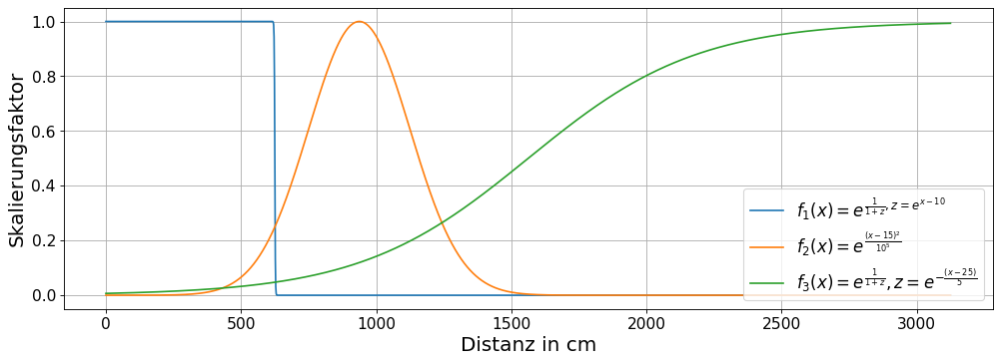

In [15]:

x = np.linspace(0,50/pixelToCM,2000)
plt.figure(figsize=(15,5),dpi=80) 
facV1 = np.exp(-x*(1/4))
facV1 = 1 / (1 + np.exp((x-(10/pixelToCM))))
facV2 = gaussian(x,15/pixelToCM,3/pixelToCM)
facV3 = 1 / (1 + np.exp(-(x-(25/pixelToCM))/(5/pixelToCM)))
plt.plot(x,facV1,label=r'$f_1(x)=e^{\frac{1}{1+z},z=e^{x-10}}$')
plt.plot(x,facV2,label=r'$f_2(x)=e^{\frac{(x-15)^2}{10^{5}}}$')
plt.plot(x,facV3,label=r'$f_3(x)=e^{\frac{1}{1+z}}, z=e^{-\frac{(x-25)}{5}}}$')
plt.ylabel("Skalierungsfaktor",fontsize=18)
plt.xlabel("Distanz in cm",fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(prop={'size': 15},loc="lower right")
plt.grid(True)

In [ ]:
x = np.linspace(0,50,200)
plt.figure(figsize=(15,5),dpi=80) 
facV1 = 1 / (1 + np.exp((x-10)))
facV2 = gaussian(x,15/,3)
facV3 = 1 / (1 + np.exp(-(x-25)/5))
plt.plot(x,facV1,label=r'$f_1(x)=e^{\frac{1}{1+z},z=e^{x-10}}$')
plt.plot(x,facV2,label=r'$f_2(x)=e^{\frac{(x-15)^2}{10^{5}}}$')
plt.plot(x,facV3,label=r'$f_3(x)=e^{\frac{1}{1+z}}, z=e^{-\frac{(x-25)}{5}}}$')
plt.ylabel("Skalierungsfaktor",fontsize=18)
plt.xlabel("Distanz in cm",fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(prop={'size': 15},loc="lower right")
plt.grid(True)

In [11]:
import torch
from torch.autograd import Variable

x = Variable(torch.tensor([2,3]).type(torch.DoubleTensor),requires_grad=True)
f = x[0]+x[1]*torch.sin(x[0])+torch.log(x[1])
f.backward()
print(x.grad)

tensor([-0.2484,  1.2426], dtype=torch.float64)


/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/10/1/trajectories_wo_gaps.npy
notFound
38630


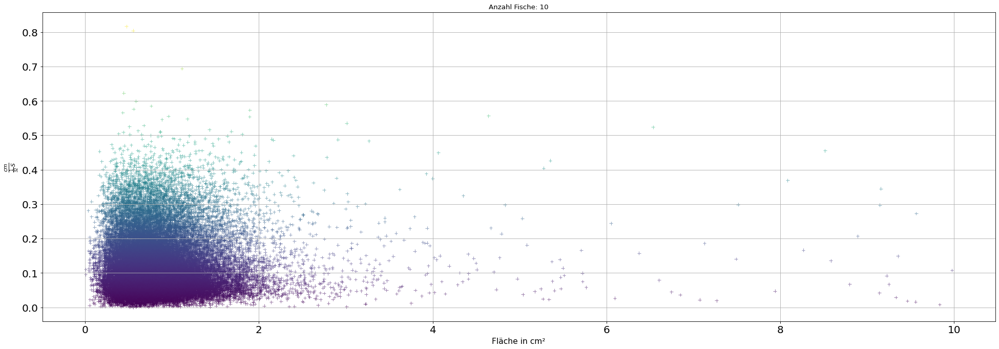

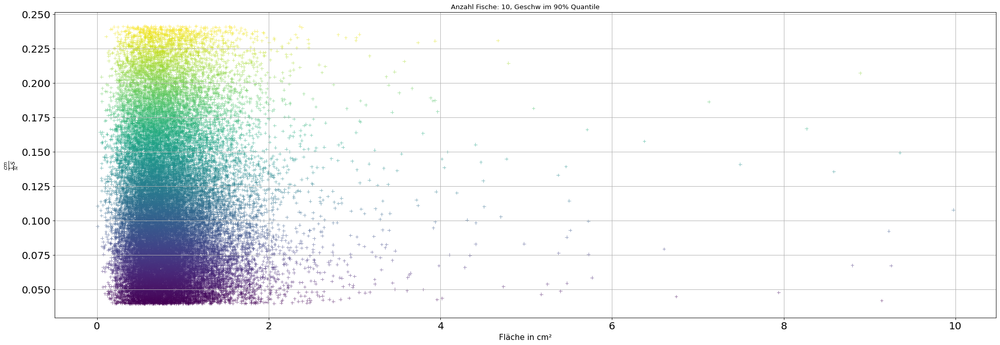

1.2279222011566162
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/10/2/trajectories_wo_gaps.npy
notFound
38620


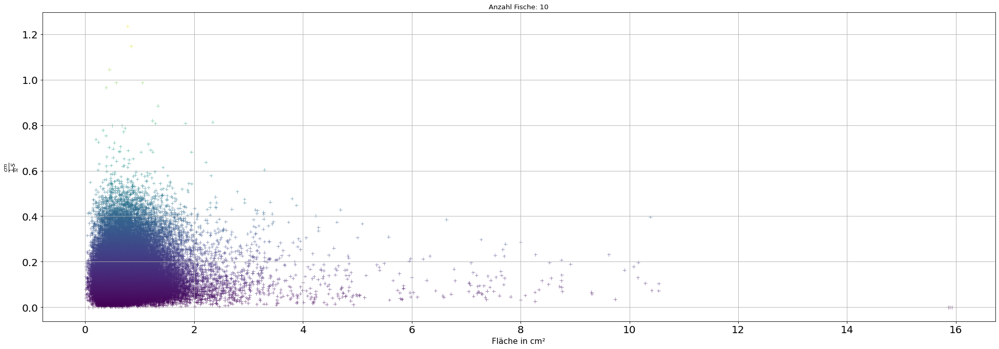

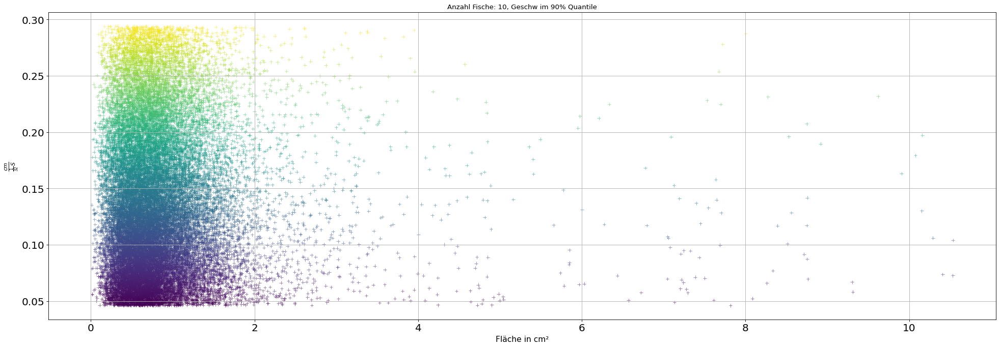

1.3121001720428467
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/10/3/trajectories_wo_gaps.npy
notFound
39080


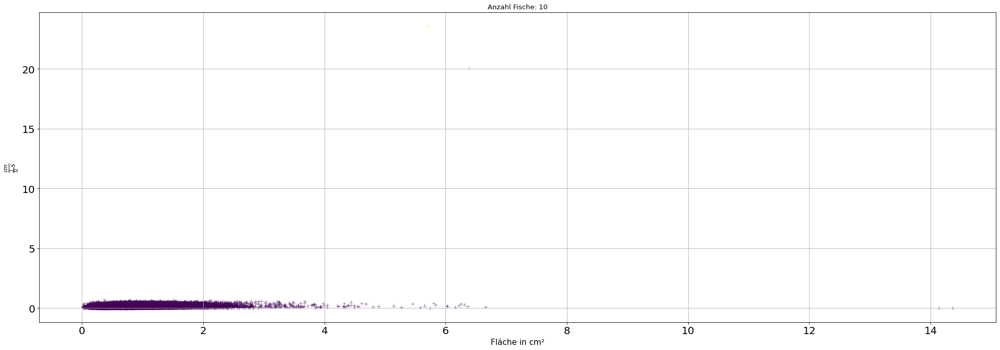

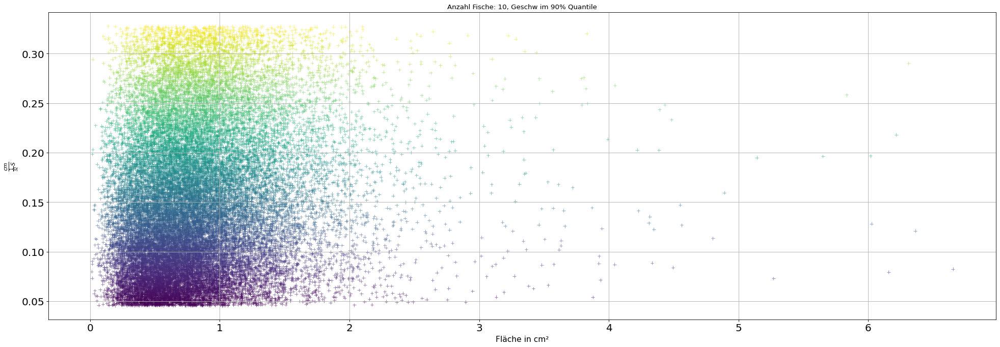

1.1909596920013428
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/60/1/trajectories_wo_gaps.npy
notFound
39060


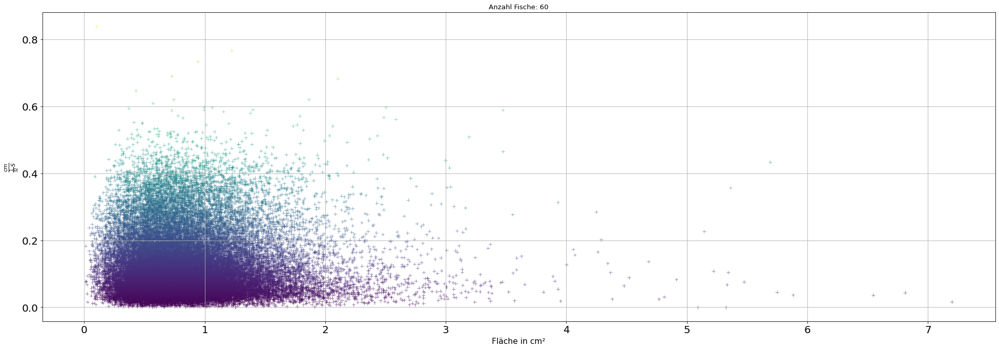

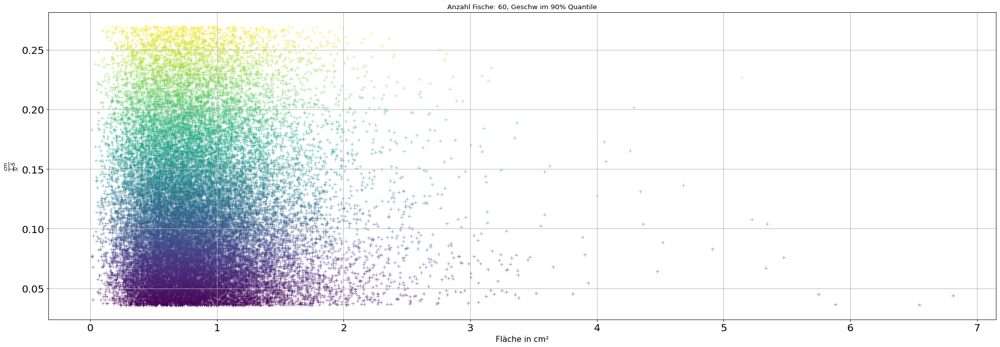

1.003408432006836
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/60/2/trajectories_wo_gaps.npy
notFound
39120


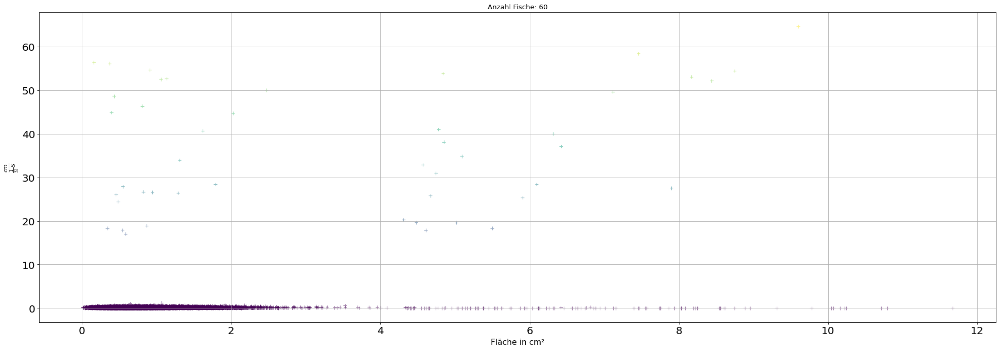

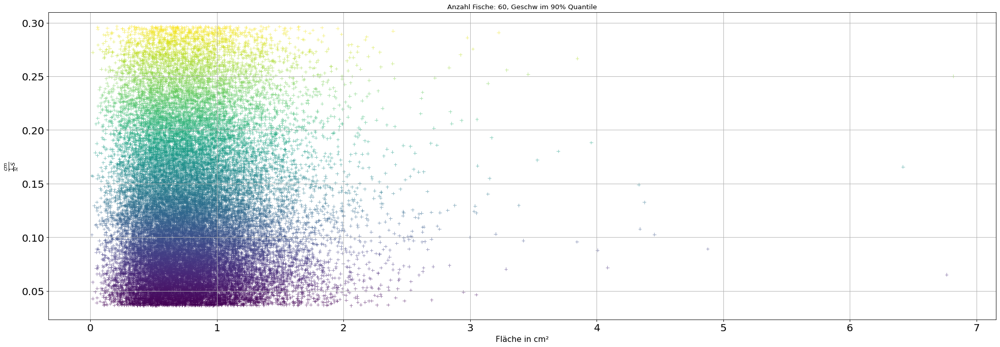

1.1159594058990479
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/60/3/trajectories_wo_gaps.npy
notFound
39060


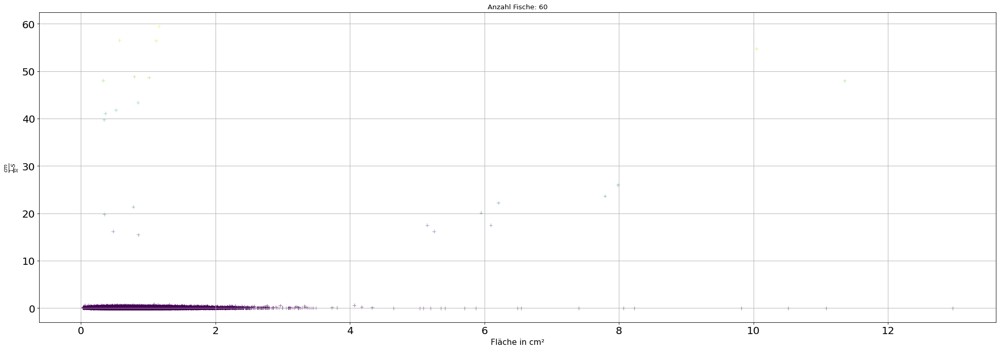

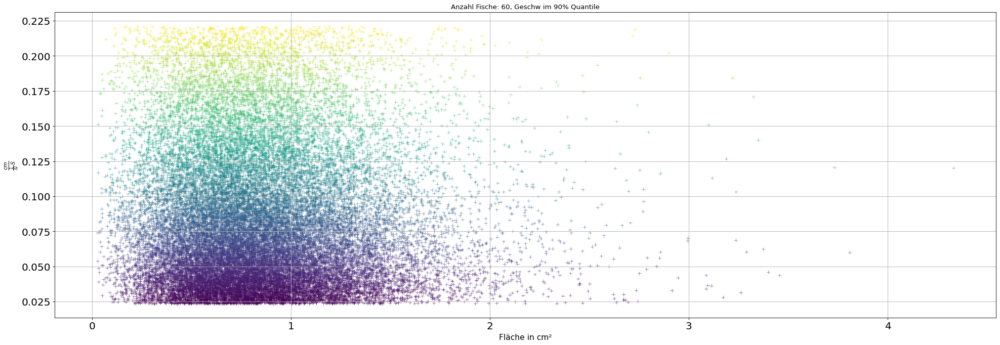

0.9631743431091309
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/80/1/trajectories_wo_gaps.npy
notFound
39120


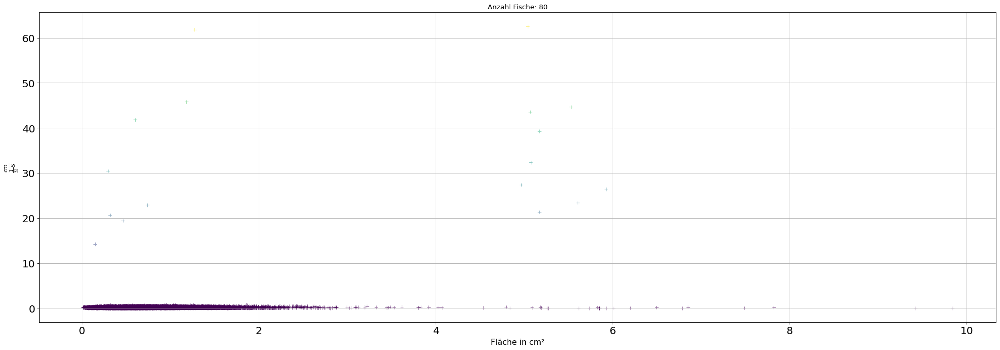

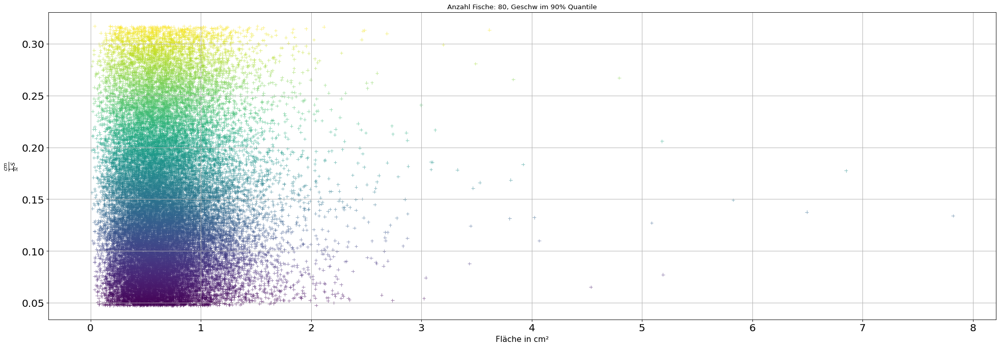

0.9059092998504639
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/80/2/trajectories_wo_gaps.npy
notFound
39360


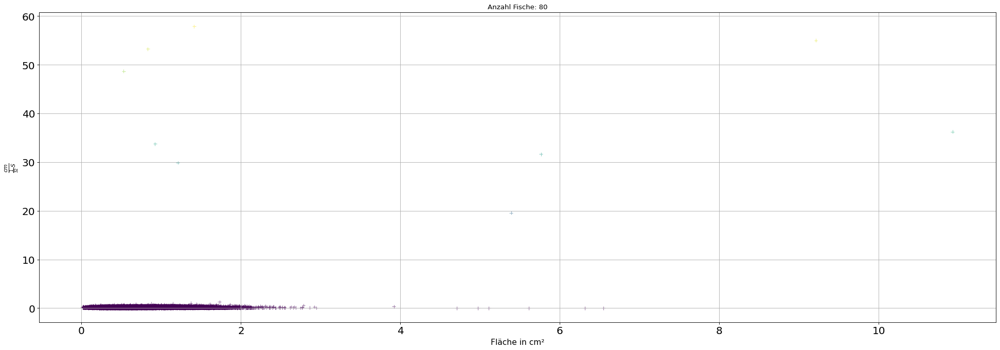

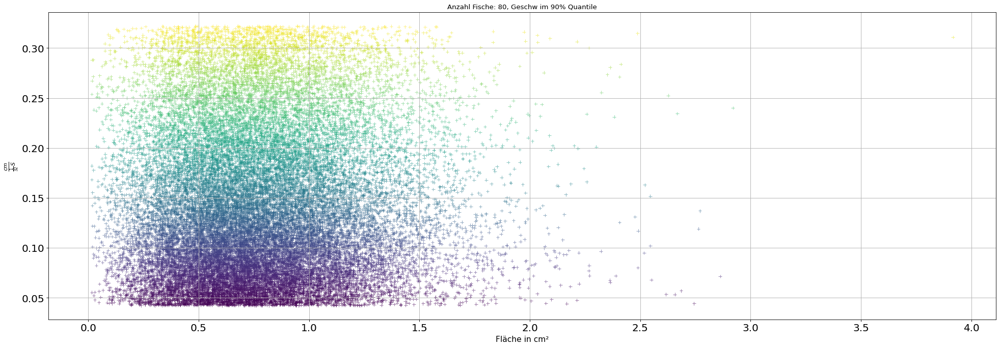

1.049375057220459
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/80/3/trajectories_wo_gaps.npy
notFound
39120


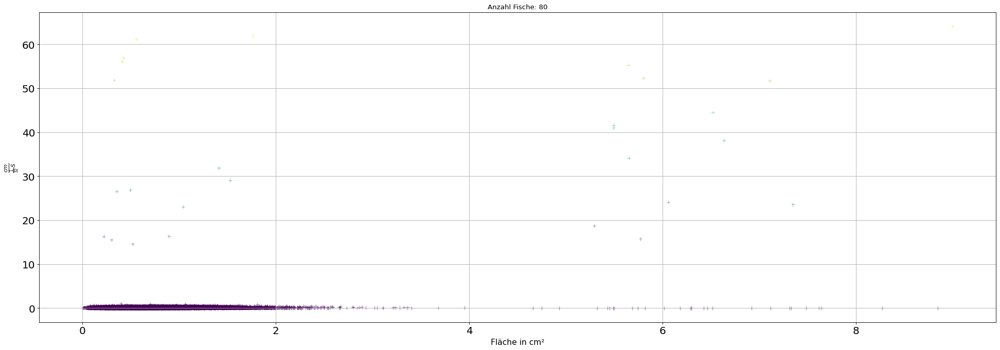

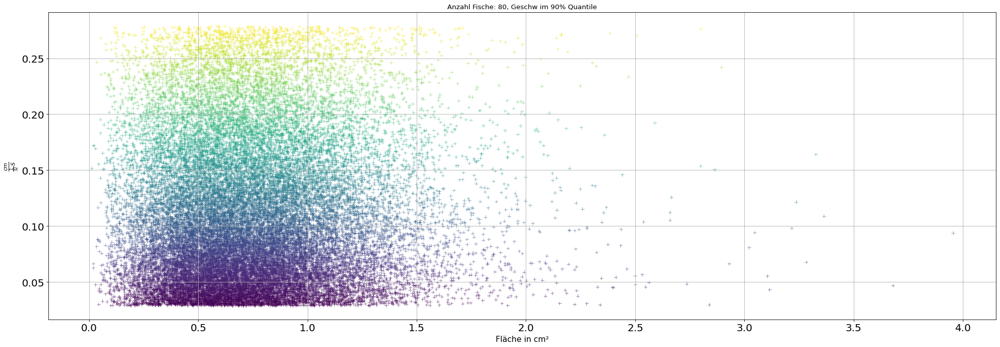

0.9105730056762695
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/100/1/trajectories_wo_gaps.npy
notFound
39500


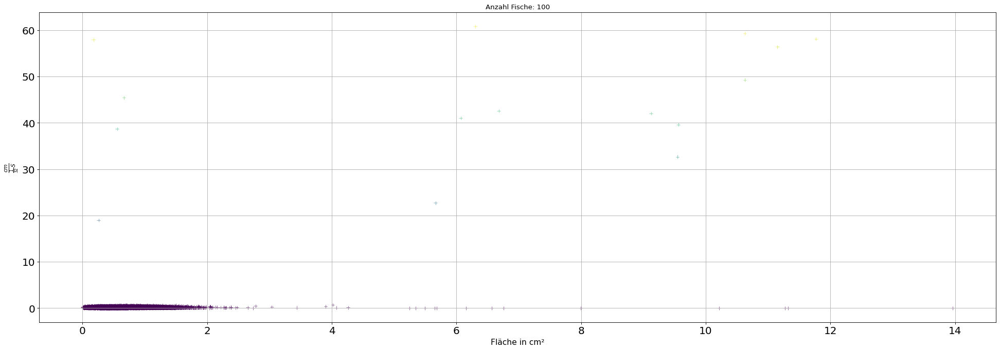

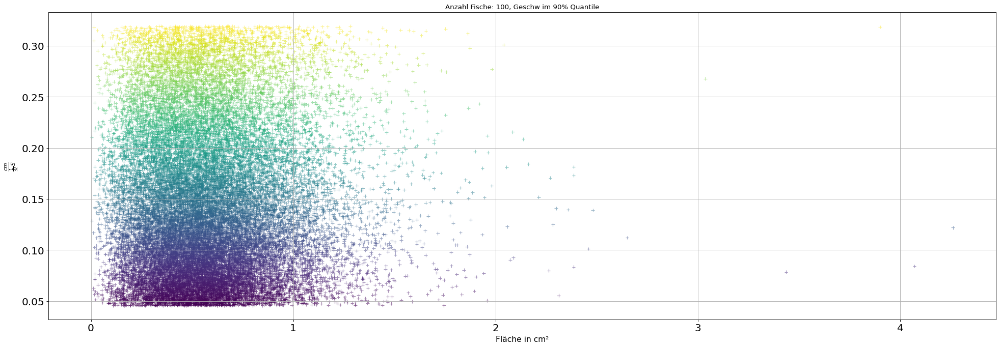

0.8770990371704102
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/100/2/trajectories_wo_gaps.npy
notFound
39300


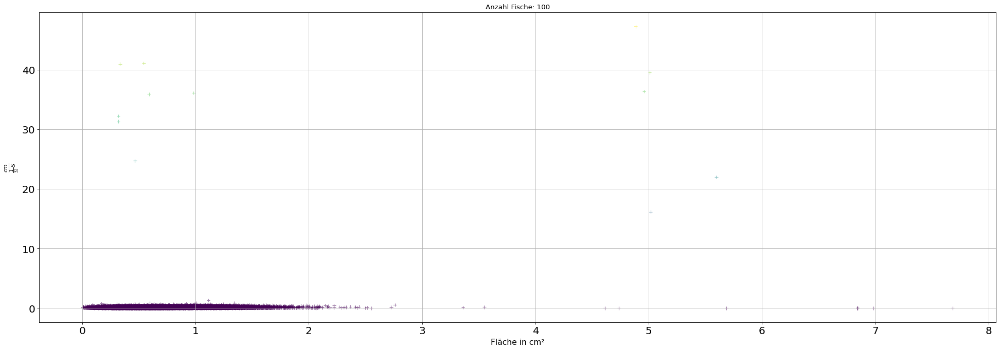

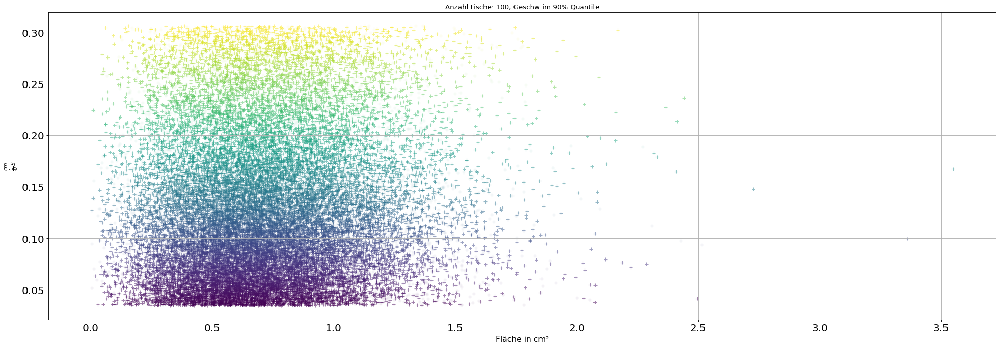

0.9880015850067139
/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/100/3/trajectories_wo_gaps.npy
notFound
39100


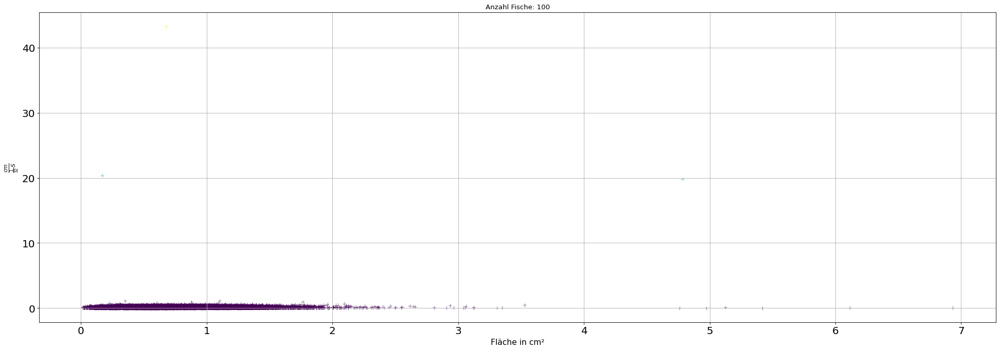

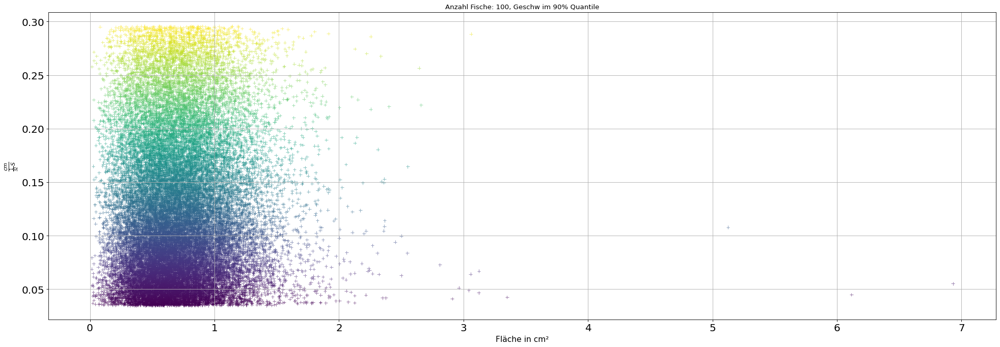

0.871049165725708


In [12]:
from time import time

pwd_base = "/mnt/HDD-1/schristo/CollectiveBehaviour/Data/zebrafish_trajectories/"
filename = "trajectories_wo_gaps.npy"
fish=[10,60,80,100]
subdirs = [1,2,3]
join = os.path.join
import torch

result = []
pixelToCM = 0.016
def density(data,title=""):
    all_angles = []
    fundamental_perFrame = []
    x_axis = []
    y_axis = []
    for i in range(2,len(data),int(title)//2):
        pos_prev_last = data[i-2]
        last_pos = data[i-1]
        pos_atm  = data[i]
        
        pos_last = torch.tensor(last_pos)
        pos_atm = torch.tensor(pos_atm)
        pos_atm = torch.nan_to_num(pos_atm)
        pos_last = torch.nan_to_num(pos_last)

        d = pos_atm.repeat(len(pos_atm),1).reshape(len(pos_atm),len(pos_atm),2)
        # transponiert und subtraktion = position von fischen - position von fisch i
        # also richtungsvektor von fisch i nach Fischen
        # Skalierung mit R = alle innerhalb R einheitskreis
        dir_scaled = (d-d.transpose(1,0))/x[0]
        dis_scaled = torch.sqrt(torch.sum(dir_scaled**2,axis=-1))
        dis_scaled[dis_scaled == 0] = np.inf
        minima = torch.min(dis_scaled,axis=0)[0]
        area = 2/np.pi*(torch.sqrt(torch.pow(minima,2)))*pixelToCM
        speed = torch.sqrt(torch.sum((pos_atm - pos_last)**2,1))*pixelToCM
        x_axis += area.tolist()
        y_axis += speed.tolist()
        fundamental_perFrame.append([speed,area])
    print(len(x_axis))
    plt.figure(figsize=(30,10),dpi=80)
    plt.scatter(x_axis,y_axis,marker="+",alpha=0.5,linewidths=1,c=y_axis)
    plt.grid(True)
    plt.ylabel(r'$\frac{cm}{\frac{1}{32}S}$',fontsize=14)
    plt.xlabel(r'Fläche in cm²',fontsize=14)    
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.title("Anzahl Fische: "+str(title))

    plt.show()
    quantile = 0.9
    upper = np.quantile(y_axis,quantile)
    lower = np.quantile(y_axis,1-quantile)
    std = np.std(y_axis)
    #mask = (y_axis < y_axis-std) & (y_axis > y_axis+std)
    mask = (y_axis < upper) & (y_axis > lower)
    x_axis = np.array(x_axis)[mask]
    y_axis = np.array(y_axis)[mask]
    plt.figure(figsize=(30,10),dpi=80)
    plt.scatter(x_axis,y_axis,marker="+",alpha=0.5,linewidths=1,c=y_axis)
    plt.grid(True)
    plt.ylabel(r'$\frac{cm}{\frac{1}{32}S}$',fontsize=14)
    plt.xlabel(r'Fläche in cm²',fontsize=14)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.title("Anzahl Fische: "+str(title)+", Geschw im "+str(int(quantile*100))+ "% Quantile")
    plt.show()
    return [x_axis,y_axis]
    #return all_angles
for i in fish:
    for s in subdirs:
        path = join(join(join(pwd_base,str(i)),str(s)),filename)
        print(path)
        data = getRealData(path)
        start = time()
        path2turningrate = path.replace(path.split("/")[-1],"density")
        try:
            turningrate = np.load(path2turningrate+".npz",allow_pickle=True)
            print("found")
        except:
            print("notFound")
            tr = np.array(density(data,title=i))
            
            #np.savez(path2turningrate,turningrate=tr)


        print(time()-start)
